#### Written by: Fariborz Norouzi

## Introduction:

The phenomenon of population growth and urban development causes traffic congestions and environmental pollution, and consequently many economic and social impacts. This is one of the most important problems and dilemmas of urban communities. The use of efficient and effective public transportation systems is considered as one of the best solutions to address these problems among city planners and managers. Analysis of public transit data gives us a good picture of the current state and efficiency of the public transport system.

Generally, there are three main kinds of public transit data which comprised:
-	Scheduling data: when and where vehicle promise to be
-	Real-time data: : when and where vehicle actually are
-	Ticketing data: who is riding the vehicles

In this sample for simplicity, we just consider scheduling with fixed data.

Public transportation agencies generate a massive volume of standard data which named General Transit Feed Specification (GTFS). GTFS data are most popular open standard for encoding scheduling data. It is developed in 2005 by Portland TriMet transit agency and Google Company. Many public transit agencies like Sacramento Regional Transit (SACRT) publicly publish their schedules GTFS usually every three months. 
GTFS files defines as comma separate value (csv file). GTFS feeds contain fixed data for scheduled transit service consisting stops, stop times, calendar, trips and route locations, with schedules information. 

## GTFS Data Model: 
Nowadays, the General Transit Feed Specification (GTFS) data format is used by too many of public transport providers around the globe. In this section, we are going to review the basic component of GTFS data. GTFS dataset is a series of comma-delimited text file with specific schema. The files are related to one another by ID fields. Some of the files are required and some optional. Following picture shows data model of GTFS data that indicates Logical ERDs (Entity Relationship Diagram). ERDs is a graphical representation that depicts relationships among diffrent files such stops, stop times, calendar, route, trips and shape files. Indeed, the geographic components of a GTFS dataset represent how vehicles travel through the system. Also, Calendar, Calendar dates and stop times text files describe the transit schedules.  


### Logical ERDs of GTFS dataset

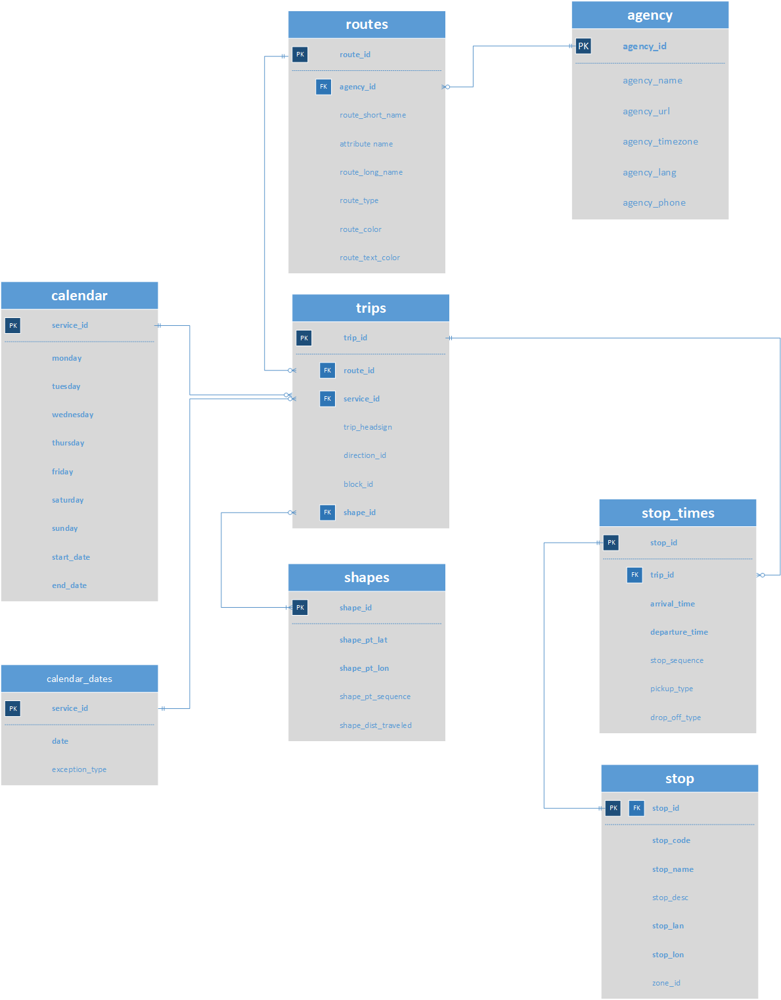

## Analysis of GTFS data with Python - Case study: Sacramento Regional Transit District

I'm using the Python programming language in the Jupyter notebook application with GTFSTK for analyzing GTFS data and generating sample ad-hoc reporting.
GTFSTK is a Python 3.6+ tool kit for analyzing GTFS data in memory without a database. It uses Pandas and Shapely to do the heavy lifting.

In [1]:
# Importing required library
import pathlib
import pandas as pd
import gtfstk as gt
import folium

In [2]:
# Read data
path = "gtfs.zip"
feed = gt.read_gtfs(path, dist_units='mi')
feed.describe()

,indicator,value
0,agencies,[Sacramento Regional Transit]
1,timezone,America/Los_Angeles
2,start_date,20220403
3,end_date,20220618
4,num_routes,71
5,num_trips,5024
6,num_stops,2859
7,num_shapes,181
8,sample_date,20220407
9,num_routes_active_on_sample_date,0


In [3]:
# List feed
gt.list_gtfs(path)

,file_name,file_size
0,agency.txt,166
1,stops.txt,224602
2,routes.txt,3368
3,trips.txt,233606
4,stop_times.txt,7452677
5,calendar.txt,197
6,calendar_dates.txt,62
7,shapes.txt,5417998
8,feed_info.txt,174
9,patterns.txt,492048


Before publishing, GTFS feeds should be validated in order to catch errors.

In [4]:
feed.validate()

,type,message,table,rows
2,error,Undefined service_id,trips,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
0,warning,Route has no trips,routes,"[32, 48]"
1,warning,"Repeated pair (trip_id, departure_time)",stop_times,"[1, 5, 12, 26, 28, 30, 32, 37, 41, 48, 62, 64,..."


This query shows some detail trips information based on 5024 trips every day (.T indicates transpose dataset).

In [5]:
feed.trips.T

,0,1,2,3,4,5,6,7,8,9,...,5014,5015,5016,5017,5018,5019,5020,5021,5022,5023
route_id,001,001,001,001,001,001,001,001,001,001,...,533,533,533,533,533,533,533,533,533,533
service_id,1,1,1,1,1,1,1,1,1,1,...,7,7,7,7,7,7,7,7,7,7
trip_id,1015782,1015783,1015784,1015785,1015786,1015787,1015788,1015789,1015790,1015791,...,1021698,1021699,1021700,1021701,1021702,1021703,1021704,1021705,1021706,1021707
trip_headsign,Watt I-80 Stationl,Watt I-80 Stationl,Watt I-80 Stationl,Watt I-80 Stationl,Watt I-80 Stationl,Watt I-80 Stationl,Watt I-80 Stationl,Watt I-80 Stationl,Watt I-80 Stationl,Watt I-80 Stationl,...,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80,BLUE LINE TO WATT I-80
direction_id,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
block_id,0101,0107,0105,0103,0104,0102,0106,0101,0109,0110,...,0010,0002,0003,0004,0005,0010,0002,0003,0004,0005
shape_id,41942,41942,41942,41942,41942,41942,41942,41942,41942,41942,...,42173,42173,42173,42173,42173,42173,42173,42173,42173,42173


The following datasets filter can be viewed based on different scenarios.

In [6]:
feed.trips.filter(['route_id', 'trip_id', 'shape_id'])

,route_id,trip_id,shape_id
0,001,1015782,41942
1,001,1015783,41942
2,001,1015784,41942
3,001,1015785,41942
4,001,1015786,41942
...,...,...,...
5019,533,1021703,42173
5020,533,1021704,42173
5021,533,1021705,42173
5022,533,1021706,42173


In [7]:
feed.trips.loc[lambda x: x.route_id == '019'].T

,268,269,270,271,272,273,274,275,276,277,...,4076,4077,4078,4079,4080,4081,4082,4083,4084,4085
route_id,019,019,019,019,019,019,019,019,019,019,...,019,019,019,019,019,019,019,019,019,019
service_id,1,1,1,1,1,1,1,1,1,1,...,7,7,7,7,7,7,7,7,7,7
trip_id,1016585,1016586,1016587,1016588,1016589,1016590,1016591,1016592,1016593,1016594,...,1016652,1016653,1016654,1016655,1016656,1016657,1016658,1016659,1016660,1016661
trip_headsign,Arden/Del Paso Station,Arden/Del Paso Station,Arden/Del Paso Station,Arden/Del Paso Station,Arden/Del Paso Station,Arden/Del Paso Station,Arden/Del Paso Station,Arden/Del Paso Station,Arden/Del Paso Station,Arden/Del Paso Station,...,Watt & Elverta,Watt & Elverta,Watt & Elverta,Watt & Elverta,Watt & Elverta,Watt & Elverta,Watt & Elverta,Watt & Elverta,Watt & Elverta,Watt & Elverta
direction_id,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
block_id,1901,1902,1901,1902,1901,1902,1901,1902,1901,1902,...,1904,1903,1904,1903,1902,1901,1902,1901,6709,1901
shape_id,41956,41956,41956,41956,41956,41956,41956,41956,41956,41956,...,41957,41957,41957,41957,41957,41957,41957,41957,41957,41957


In [8]:
feed.trips.groupby("route_id").get_group("075").T

,1245,1246,1247,1248,1249,1250,1251,1252,1253,1254,...,4523,4524,4525,4526,4527,4528,4529,4530,4531,4532
route_id,075,075,075,075,075,075,075,075,075,075,...,075,075,075,075,075,075,075,075,075,075
service_id,1,1,1,1,1,1,1,1,1,1,...,7,7,7,7,7,7,7,7,7,7
trip_id,1018696,1018697,1018698,1018699,1018700,1018701,1018702,1018703,1018704,1018705,...,1018792,1018793,1018794,1018795,1018796,1018797,1018798,1018799,1018800,1018801
trip_headsign,Rancho Cordova/Mather,Rancho Cordova/Mather,Rancho Cordova/Mather,Rancho Cordova/Mather,Rancho Cordova/Mather,Rancho Cordova/Mather,Rancho Cordova/Mather,Rancho Cordova/Mather,Rancho Cordova/Mather,Rancho Cordova/Mather,...,Butterfield Station,Butterfield Station,Butterfield Station,Butterfield Station,Butterfield Station,Butterfield Station,Butterfield Station,Butterfield Station,Butterfield Station,Butterfield Station
direction_id,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
block_id,7501,7502,7501,7502,7501,7502,7501,7502,7501,7502,...,7203,7202,7201,7203,7202,7201,7203,7202,7201,7203
shape_id,42004,42004,42004,42004,42004,42004,42004,42004,42004,42004,...,42005,42005,42005,42005,42005,42005,42005,42005,42005,42005


In [9]:
# Compute number of trips per route: split, apply and combine
def my_agg(group):
    d={}
    d["num_trips"] = group.shape[0]
    return pd.Series(d)
# Use method changing
(
feed.trips.groupby("route_id").apply(my_agg).reset_index()
.merge(feed.routes.filter(["route_id", "route_short_name", "route_long_name", "route_type"]))
.sort_values("num_trips", ascending = False).T
)

,66,64,12,0,21,6,9,13,17,16,...,61,60,58,49,53,59,57,56,55,54
route_id,533,507,051,001,081,023,030,056,068,067,...,252,248,246,210,214,247,228,227,226,215
num_trips,346,345,264,248,197,157,157,156,146,144,...,2,2,2,2,2,1,1,1,1,1
route_short_name,Blue,Gold,51,1,81,23,30,56,68,67,...,252,248,246,210,214,247,228,227,226,215
route_long_name,Meadowview - Watt/I-80,Downtown - Folsom,STOCKTON/BROADWAY,GREENBACK,FLORIN,EL CAMINO,J STREET,MEADOWVIEW,OAK PARK,FRANKLIN,...,FREEPORT - FRUITRIDGE - ML KING,MEADOWVIEW RD - RUSH RIVER DR,MEADOWVIEW - GREENHAVEN,LA RIVIERA DR,BROADWAY - STOCKTON BLVD,21ST ST - FLORIN RD,GLORIA DR - RUSH RIVER DR,SOUTH LAND PARK - GREENHAVEN DR,POCKET RD - RIVERSIDE BLVD,14TH AVE - FLORIN TOWNE
route_type,0,0,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3


In [10]:
# Compute trip stats
trip_stats = feed.compute_trip_stats()
# Add shape_dist_traveled column to stop times
feed = feed.append_dist_to_stop_times(trip_stats)
feed.stop_times.T

,0,1,2,3,4,5,6,7,8,9,...,193150,193151,193152,193153,193154,193155,193156,193157,193158,193159
trip_id,1015782,1015782,1015782,1015782,1015782,1015782,1015782,1015782,1015782,1015782,...,1047513,1047513,1047513,1047513,1047513,1047513,1047513,1047513,1047513,1047513
arrival_time,12:11:00,12:11:00,12:12:00,12:13:00,12:14:00,12:14:00,12:15:00,12:16:00,12:17:00,12:18:00,...,17:18:00,17:19:00,17:20:00,17:21:00,17:22:00,17:23:00,17:24:00,17:25:00,17:28:00,17:30:00
departure_time,12:11:00,12:11:00,12:12:00,12:13:00,12:14:00,12:14:00,12:15:00,12:16:00,12:17:00,12:18:00,...,17:18:00,17:19:00,17:20:00,17:21:00,17:22:00,17:23:00,17:24:00,17:25:00,17:28:00,17:30:00
stop_id,1184,3301,1187,1188,1189,1190,1191,1192,1193,1195,...,164,165,166,167,173,168,169,170,171,172
stop_sequence,1,2,3,4,5,6,7,8,9,10,...,32,33,34,35,36,37,38,39,40,41
pickup_type,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
drop_off_type,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
shape_dist_traveled,0.0653983,0.176938,0.397957,0.672739,0.911181,1.17847,1.34262,1.5232,1.73403,2.10574,...,9.45996,9.69881,10.0318,10.1865,10.3743,10.618,10.8506,11.1081,11.8065,12.158


### Creating interactive inline Jupyter map of Sacramento Transit Route

I used folium which it is a powerful Python library to create interactive map. Users can easily zoom in and out on map. In addition, by clicking on each circle which indicates bus stop location; users can retrieve bus stop information and also by clicking on each line coresponding route information is visible.

By hovering pointer to top right corner of map, you can see all active list of transit routes that shown on map. users by uncheck or check box can quickly remove or add route on map.    

In [15]:
rids = feed.routes.route_id 
feed.map_routes(rids)